# Steps to Build the Face Recognition System


###1. Install Libraries

In [ ]:
#The face_recognition library, created and maintained by Adam Geitgey,
# wraps around dlib facial recognition functionality.
!pip install face_recognition

# dlib is a modern C++ toolkit containing machine learning algorithms and
# tools for creating complex software in C++ to solve real-world problems.
!pip install dlib  #==19.18


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566170 sha256=8c14c8c76fc4ee4ce060a57b833be748d8872c3271765a9533abe39c485f2208
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models


### Import Libraries

In [ ]:
import face_recognition   ##Detecting and recogniting faces
import cv2     ## intracting with images
import os       ## For Reading the file name
from google.colab.patches import cv2_imshow ## we are importing cv2_imshow from google.colab.patches because google colab doesn't support cv2.imshow() funciton.
import numpy as np
import imutils
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

### Load Images

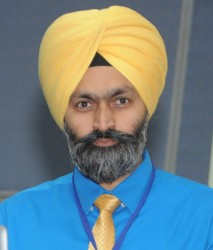

In [ ]:
url1 = '/content/apj.png'
url = '/content/sarwan.jpg'
imgapj_bgr = face_recognition.load_image_file(url)
imgapj_rgb = cv2.cvtColor(imgapj_bgr,cv2.COLOR_BGR2RGB)
#cv2_imshow( imgapj_bgr)
cv2_imshow( imgapj_rgb)

In [ ]:
#----------Finding face Location for drawing bounding boxes-------
face = face_recognition.face_locations(imgapj_rgb)[0]
(top,right,bottom,left) = face
print (face)

(76, 145, 166, 56)


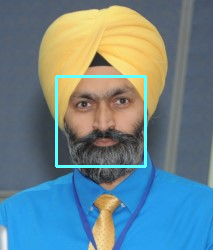

In [ ]:
copy = imgapj_rgb.copy() # make copy of original image
#-------------------Drawing the Rectangle-------------------------
cv2.rectangle(copy, (left,top),(right,bottom),(255,255,100),2)
cv2_imshow(copy) # print rectangle on copy image

In [ ]:
#--Converting image into encodings
train_encode = face_recognition.face_encodings(imgapj_rgb)[0]

In [ ]:
print( train_encode)

[-0.15733734  0.08309652  0.03361946 -0.02834397 -0.15203491 -0.01134361
  0.02554229 -0.04740772  0.10202247 -0.00566289  0.13521004 -0.01291833
 -0.23257805  0.00822985 -0.00547106  0.06458685 -0.06917329 -0.24494527
 -0.14294358 -0.09663786  0.02662766  0.08429036 -0.03969135 -0.00664606
 -0.11952724 -0.25564113 -0.02876356 -0.07582442  0.11513717 -0.07687846
 -0.00324949  0.02632479 -0.21806952 -0.02890315  0.02606573  0.07972273
  0.02498461 -0.07407049  0.22490901 -0.04823805 -0.20554867 -0.01801434
  0.09006132  0.25520501  0.10077333  0.00587381  0.00422229  0.04275134
  0.04019578 -0.25664476  0.1117492   0.16333765  0.10423794  0.09506235
  0.02386225 -0.17392361 -0.04059789  0.1022777  -0.17303212  0.12537989
  0.06793635 -0.09710611 -0.07958338 -0.1580624   0.22998735  0.14775994
 -0.08520233 -0.19627291  0.12333542 -0.19612128 -0.12493238  0.06704614
 -0.08144787 -0.03839665 -0.25204942  0.0184149   0.32855102  0.09294372
 -0.17851709  0.05214667 -0.0768934   0.00947345  0

####Testing

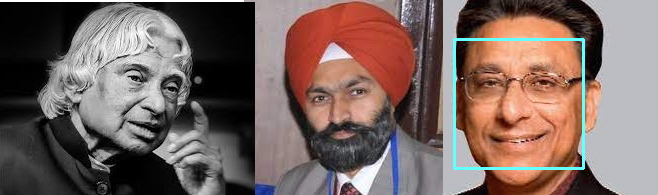

In [ ]:
url ='/content/APJsarwanVinod.png'
#load image
img1 = face_recognition.load_image_file(url)
#covert image to RGB
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
#------to find the face location
#find face_locations  - topleft cordinate and botton right cordinate
face = face_recognition.face_locations(img1)[0]
(top,right,bottom,left) = face

copy = img1.copy() # make copy of original image
#-------------------Drawing the Rectangle-------------------------
cv2.rectangle(copy, (left,top),(right,bottom),(255,255,100),2)
cv2_imshow(copy)


Faces detected  3


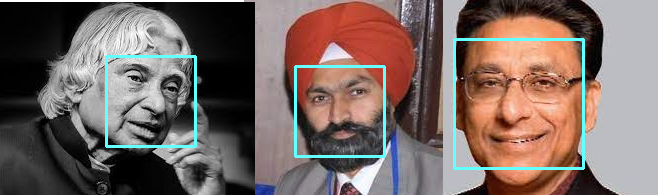

In [ ]:
url ='/content/APJsarwanVinod.png'
# load image
img1 = face_recognition.load_image_file(url)

# convert to RGB
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)

# find the face location
faces = face_recognition.face_locations(img1)
#print (faces)
copy = img1.copy() # make copy of original image
print ('Faces detected  ' + str(len(faces)))

for face in faces:
  top,right,bottom,left = face
  cv2.rectangle(copy, (left,top),(right,bottom),(255,255,100),2)

cv2_imshow(copy)

# Train and Test

In [ ]:
# Load a sample picture and learn how to recognize it.
image1         = face_recognition.load_image_file("/content/sarwan.jpg")
image1_face_encoding = face_recognition.face_encodings(image1)[0]

# Load a second sample picture and learn how to recognize it.
image2          = face_recognition.load_image_file("/content/priyanka.jpg")
image2_face_encoding  = face_recognition.face_encodings(image2)[0]

In [ ]:
# Create arrays of known face encodings and their names
known_face_encodings = [
    image1_face_encoding,
    image2_face_encoding
]
known_face_names = [
    "Sarwan",
    "Priyanka Chopra"
]


#### Test

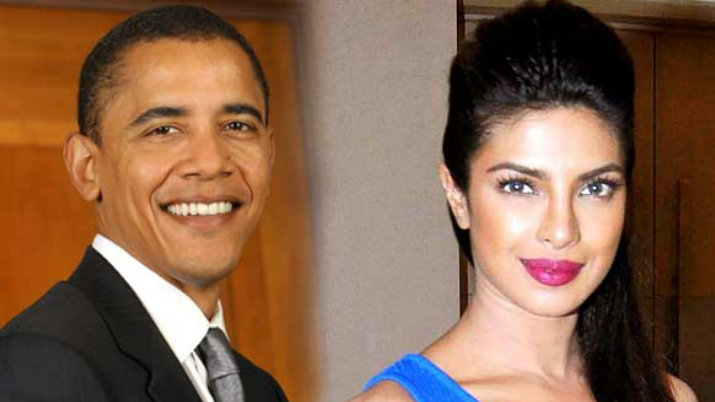

2 [(77, 304, 263, 118), (150, 631, 305, 476)]


In [ ]:
url = '/content/priyankaObama.png'

img1 = face_recognition.load_image_file(url)
# convert to RGB
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
# Find all the faces and face encodings in the current frame of video
face_locations = face_recognition.face_locations(img1)
face_encodings = face_recognition.face_encodings(img1, face_locations)
cv2_imshow(img1)
print (len(face_locations), face_locations)

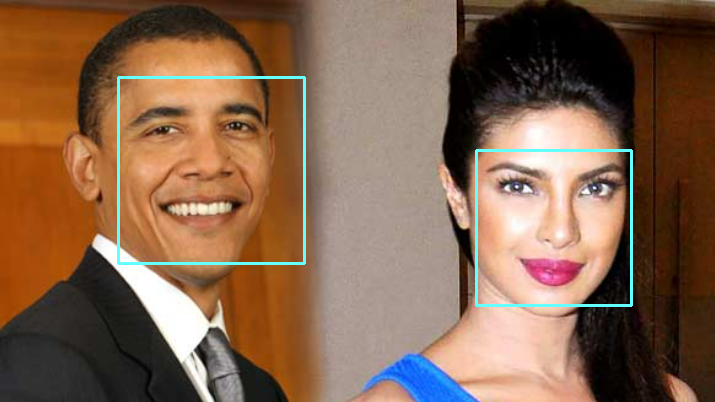

[False, False]
[False, True]
1 Priyanka Chopra


In [ ]:
copy = img1.copy() # make copy of original image

for face in face_locations :
  top,right,bottom,left = face
  cv2.rectangle(copy, (left,top),(right,bottom),(255,255,100),2)

cv2_imshow(copy)
# #font = cv2.FONT_HERSHEY_DUPLEX
# #cv2.putText(copy, "Unknown", (left , bottom), font, 1.0, (255, 255, 255),1)

matches = face_recognition.compare_faces(known_face_encodings,face_encodings[0])
print(matches)
matches = face_recognition.compare_faces(known_face_encodings,face_encodings[1])
print(matches)

for i in range( len(matches)) :
  if matches[i] == True :
    print (i, known_face_names[i])


#### Complete code

##### Training  

In [ ]:
# Load a sample picture and learn how to recognize it.
image1         = face_recognition.load_image_file("/content/sarwan.jpg")
image1_face_encoding = face_recognition.face_encodings(image1)[0]

# Load a second sample picture and learn how to recognize it.
image2          = face_recognition.load_image_file("/content/priyanka.jpg")
image2_face_encoding  = face_recognition.face_encodings(image2)[0]

In [ ]:
# Create arrays of known face encodings and their names
known_face_encodings = [
    image1_face_encoding,
    image2_face_encoding
]
known_face_names = [
    "Sarwan",
    "Priyanka Chopra"
]


##### Testing  

In [ ]:
# test image to recognise face
url = '/content/priyankaObama.png'
url = '/content/APJsarwanVinod.png'

img1 = face_recognition.load_image_file(url)
# convert to RGB
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)

# Find all the faces and face encodings in the current frame of video
face_locations = face_recognition.face_locations(img1)
face_encodings = face_recognition.face_encodings(img1, face_locations)

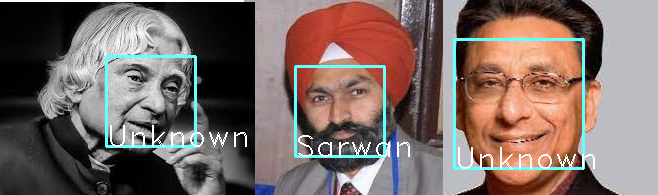

In [ ]:
# known_face_encodings - is the list created from the trained face encoding
# face_encodings needs to be compared/searched in the list  known_face_encodings
copy = img1.copy()
font = cv2.FONT_HERSHEY_DUPLEX
for oneface in range(len(face_encodings) ):
  # draw box around face
  top,right,bottom,left = face_locations[oneface]
  cv2.rectangle(copy, (left,top),(right,bottom),(255,255,100),2)
  # compare and get name /print
  matches = face_recognition.compare_faces(known_face_encodings,face_encodings[oneface])
  if True in matches :
    for i in range ( len(matches)):
      if matches[i]== True :
        #print (known_face_names[i])
        cv2.putText(copy,known_face_names[i], (left , bottom), font, 1.0, (255, 255, 255),1)
  else:
    cv2.putText(copy, "Unknown", (left , bottom), font, 1.0, (255, 255, 255),1)
    #print ("unknown")

cv2_imshow(copy)

#### Optimization

In [ ]:
face_names = []
for face_encoding in face_encodings:
    # See if the face is a match for the known face(s)
    matches = face_recognition.compare_faces(known_face_encodings, face_encoding)
    name = "Unknown"

    # # If a match was found in known_face_encodings, just use the first one.
    if True in matches:
        first_match_index = matches.index(True)
        name = known_face_names[first_match_index]
    # Or instead, use the known face with the smallest distance to the new face
    face_distances = face_recognition.face_distance(known_face_encodings, face_encoding)
    best_match_index = np.argmin(face_distances)
    if matches[best_match_index]:
        name = known_face_names[best_match_index]

    face_names.append(name)

print (face_names )

['Unknown', 'Unknown', 'Sarwan S', 'Unknown']


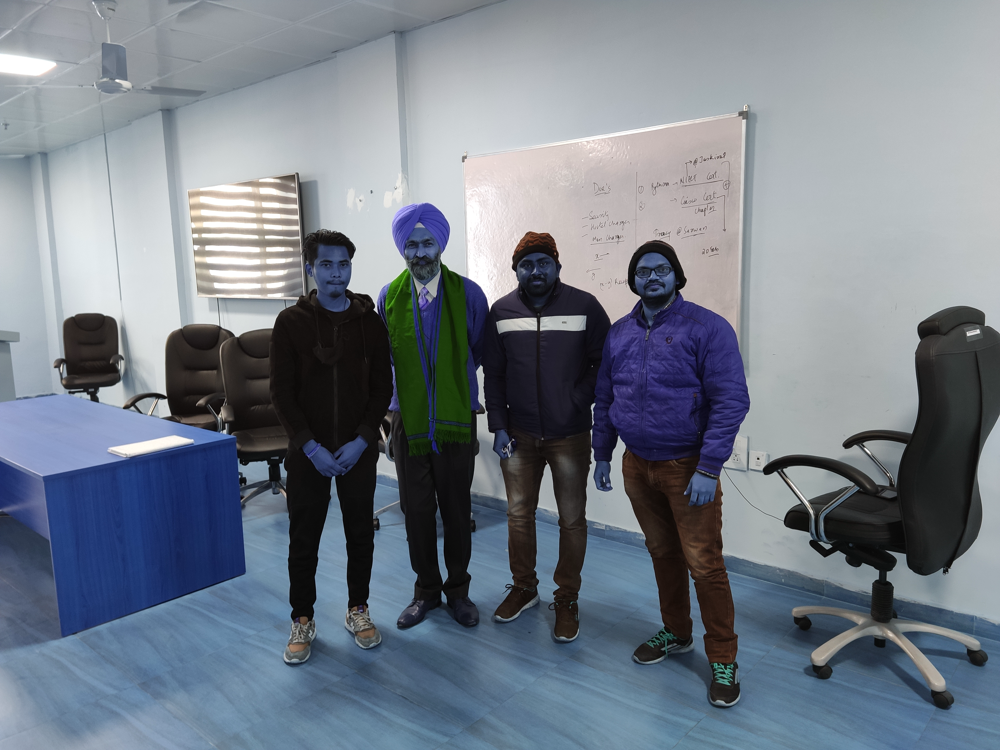

In [ ]:
# Display the results
for (top, right, bottom, left), name in zip(face_locations, face_names):
    # Scale back up face locations since the frame we detected in was scaled to 1/4 size
    top *= 4
    right *= 4
    bottom *= 4
    left *= 4

    # Draw a box around the face
    cv2.rectangle(img1, (left, top), (right, bottom), (0, 0, 255), 2)

    # Draw a label with a name below the face
    cv2.rectangle(img1, (left, bottom - 35), (right, bottom), (0, 0, 255), cv2.FILLED)
    font = cv2.FONT_HERSHEY_DUPLEX
    cv2.putText(img1, name, (left + 6, bottom - 6), font, 1.0, (255, 255, 255), 1)
#show the image with names
cv2_imshow(img1)

# Connecting Webcam

####1. Import required Python libraries

In [ ]:
import face_recognition   ##Detecting and recogniting faces
import cv2     ## intracting with images
import os       ## For Reading the file name
from google.colab.patches import cv2_imshow ## we are importing cv2_imshow from google.colab.patches because google colab doesn't support cv2.imshow() funciton.
import numpy as np
import imutils
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

####2. Start webcam

In [ ]:
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
def faceRecognition (imgFileName):
  img1 = face_recognition.load_image_file(imgFileName)
  # convert to RGB
  img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
  # Find all the faces and face encodings in the current frame of video
  face_locations = face_recognition.face_locations(img1)
  face_encodings = face_recognition.face_encodings(img1, face_locations)

  copy = img1.copy()
  font = cv2.FONT_HERSHEY_DUPLEX
  for oneface in range(len(face_encodings) ):
    # draw box around face
    top,right,bottom,left = face_locations[oneface]
    cv2.rectangle(copy, (left,top),(right,bottom),(255,255,100),2)
    # compare and get name /print
    matches = face_recognition.compare_faces(known_face_encodings,face_encodings[oneface])
    if True in matches :
      for i in range ( len(matches)):
        if matches[i]== True :
          #print (known_face_names[i])
          cv2.putText(copy,known_face_names[i], (left , bottom), font, 1.0, (255, 255, 255),1)
    else:
      cv2.putText(copy, "Unknown", (left , bottom), font, 1.0, (255, 255, 255),1)
      #print ("unknown")

  cv2_imshow(copy)

####4. Test the complete System

Click 'Capture' to make photo using your webcam.

In [ ]:
image_file = take_photo()

<IPython.core.display.Javascript object>

Send image to faceRecognition method

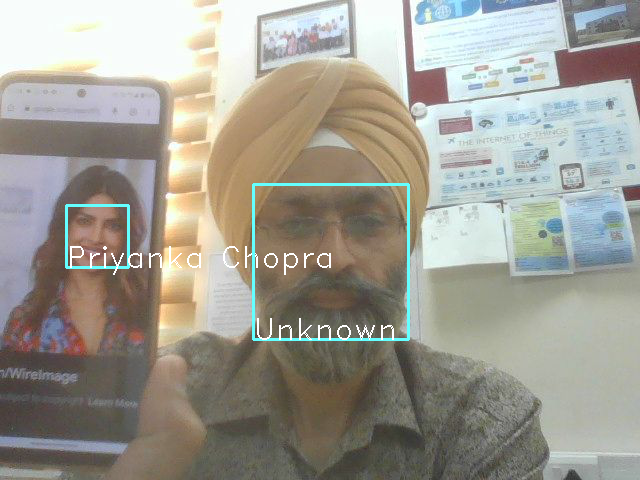

In [ ]:
faceRecognition(image_file)

####5. Push the name in the Database

# Attendance System

### 1. Building a Face Recognition System

In [ ]:
import cv2
import face_recognition
import os
import numpy as np
from datetime import datetime
import pickle
from google.colab.patches import cv2_imshow

In [ ]:
#traverse all image file present in path directory, read images, and
#append the image array to the image list, and file-name to classNames.
path = 'train_images'
images = []
classNames = []
mylist = os.listdir(path)
for cl in mylist:
    if cl == '.ipynb_checkpoints': continue
    curImg = cv2.imread(f'{path}/{cl}')
    images.append(curImg)
    classNames.append(os.path.splitext(cl)[0])
print (classNames)

['kalam', 'sarwan']


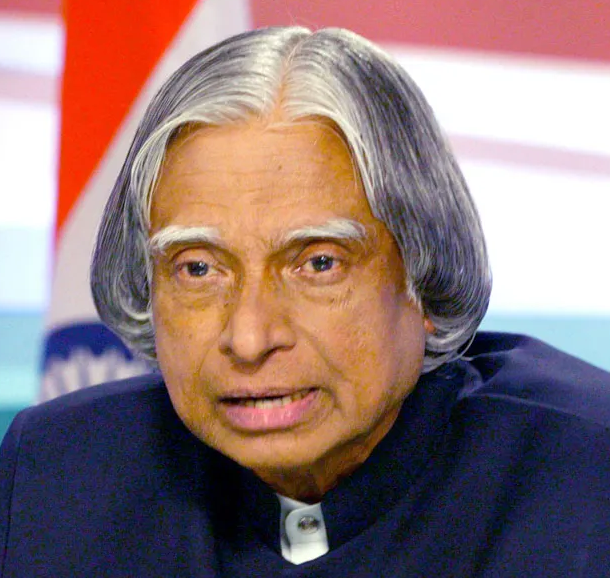

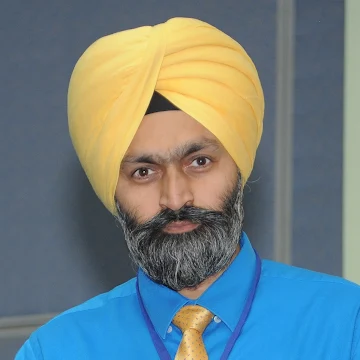

In [ ]:
#check all images
for img in images :
  cv2_imshow(img)



In [ ]:
#create a function to encode all the train
#images and store them in a variable encoded_face_train.
def findEncodings(images):
    encodeList = []
    for img in images:
        #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        try:
          encoded_face = face_recognition.face_encodings(img)[0]
          encodeList.append(encoded_face)
        except IndexError as e:
          print("No face found ")
          cv2_imshow(img)
          continue
    return encodeList


In [ ]:
encoded_face_train = findEncodings(images)

In [ ]:
def markAttendance(name):
    with open('Attendance.csv','r+') as f:
        myDataList = f.readlines()
        nameList = []
        for line in myDataList:
            entry = line.split(',')
            nameList.append(entry[0])
        if name not in nameList:
            now = datetime.now()
            time = now.strftime('%I:%M:%S:%p')
            date = now.strftime('%d-%B-%Y')
            f.writelines(f'n{name}, {time}, {date}')